In [415]:
import sys
KITTI_ROOT_PATH = '/home/ruizhu/Documents/Datasets/kitti'
sys.path.append(KITTI_ROOT_PATH+'/kitti-lidar-utils')
sys.path.append(KITTI_ROOT_PATH+'/kitti-lidar-utils/source')
sys.path.append(KITTI_ROOT_PATH+'/depth/devkit/python')

import numpy as np
np.set_printoptions(precision=4, suppress=True)

%reload_ext autoreload
%autoreload 2

from scipy.io import savemat
import itertools
import pdb
import os
from PIL import Image, ImageOps
import imageio
%matplotlib inline
import matplotlib.pyplot as plt
import matplotlib.patches as patches
import time
from source.utils import load_tracklets_for_frames, point_inside, in_hull
from source import parseTrackletXML as xmlParser
from source.kitti_util import *
import argparse
from matplotlib import cm
from math import atan2, degrees
from PIL import Image
from read_depth import *
from IPython.core.display import display, HTML
display(HTML("<style>.container { width:90% !important; }</style>"))
import torch

import dsac_tools.utils_F as utils_F
import dsac_tools.utils_geo as utils_geo
import dsac_tools.utils_misc as utils_misc
import dsac_tools.utils_vis as utils_vis
import dsac_tools.utils_opencv as utils_opencv
from dsac_tools.H_loss import HLoss
from dsac_tools.dsac import DSAC

from kitti_tools.utils_kitti import *
kitti_two_frame_loader = KittiLoader(KITTI_ROOT_PATH)

## Select sequence
date_name = '2011_09_26'
seq_name = '_drive_0005_sync'

kitti_two_frame_loader.set_drive(date_name, seq_name)
kitti_two_frame_loader.get_left_right_gt()
kitti_two_frame_loader.load_cam_poses()
# kitti_two_frame_loader.show_demo()
kitti_two_frame_loader.rectify_all(visualize=False)

## Help functions and plot params
fig_scale = 300
fig_ratio = [4, 3]
im_shape = kitti_two_frame_loader.im_shape

KITTI track loaded at /home/ruizhu/Documents/Datasets/kitti/raw/2011_09_26/2011_09_26_drive_0005_sync/.
[[721.5377   0.     609.5593  44.8573]
 [  0.     721.5377 172.854    0.2164]
 [  0.       0.       1.       0.0027]]
[[ 721.5377    0.      609.5593 -339.5242]
 [   0.      721.5377  172.854     2.1999]
 [   0.        0.        1.        0.0027]]
GT camera for left/right.
[[1. 0. 0.]
 [0. 1. 0.]
 [0. 0. 1.]]
[[1. 0. 0.]
 [0. 1. 0.]
 [0. 0. 1.]]
[[ 0.0598]
 [-0.0004]
 [ 0.0027]]
[[-0.4729]
 [ 0.0024]
 [ 0.0027]]
[[1. 0. 0.]
 [0. 1. 0.]
 [0. 0. 1.]] [[-0.5327]
 [ 0.0028]
 [-0.    ]]
[[ 0.0075 -1.     -0.0006 -0.0041]
 [ 0.0148  0.0007 -0.9999 -0.0763]
 [ 0.9999  0.0075  0.0148 -0.2718]
 [ 0.      0.      0.      1.    ]]
[[ 0.0075 -1.     -0.0006 -0.0041]
 [ 0.0148  0.0007 -0.9999 -0.0763]
 [ 0.9999  0.0075  0.0148 -0.2718]
 [ 0.      0.      0.      1.    ]]
Scene pose loaded. First two poses:
[array([[ 1., -0., -0., -0.],
       [ 0.,  1.,  0.,  0.],
       [-0.,  0.,  1.,  0.]]), a

In [439]:
kitti_two_frame_loader.load_cam_poses()

['/home/ruizhu/Documents/Datasets/kitti/raw/2011_09_26/2011_09_26_drive_0005_sync/oxts/data/0000000000.txt', '/home/ruizhu/Documents/Datasets/kitti/raw/2011_09_26/2011_09_26_drive_0005_sync/oxts/data/0000000001.txt', '/home/ruizhu/Documents/Datasets/kitti/raw/2011_09_26/2011_09_26_drive_0005_sync/oxts/data/0000000002.txt', '/home/ruizhu/Documents/Datasets/kitti/raw/2011_09_26/2011_09_26_drive_0005_sync/oxts/data/0000000003.txt', '/home/ruizhu/Documents/Datasets/kitti/raw/2011_09_26/2011_09_26_drive_0005_sync/oxts/data/0000000004.txt', '/home/ruizhu/Documents/Datasets/kitti/raw/2011_09_26/2011_09_26_drive_0005_sync/oxts/data/0000000005.txt', '/home/ruizhu/Documents/Datasets/kitti/raw/2011_09_26/2011_09_26_drive_0005_sync/oxts/data/0000000006.txt', '/home/ruizhu/Documents/Datasets/kitti/raw/2011_09_26/2011_09_26_drive_0005_sync/oxts/data/0000000007.txt', '/home/ruizhu/Documents/Datasets/kitti/raw/2011_09_26/2011_09_26_drive_0005_sync/oxts/data/0000000008.txt', '/home/ruizhu/Documents/Dat

Scene pose loaded. First two poses:
[array([[ 1., -0., -0., -0.],
       [ 0.,  1.,  0.,  0.],
       [-0.,  0.,  1.,  0.]]), array([[ 0.9999,  0.0005,  0.0157,  0.0088],
       [-0.0005,  1.    , -0.0046,  0.0056],
       [-0.0157,  0.0046,  0.9999, -0.3418]])]


In [406]:
print(kitti_two_frame_loader.Rtl_gt)

[[ 1.      0.      0.      0.0598]
 [ 0.      1.      0.     -0.0004]
 [ 0.      0.      1.      0.0027]
 [ 0.      0.      0.      1.    ]]


## Get two frames

[[ 0.9992 -0.0021  0.0404 -0.0269]
 [ 0.0031  0.9997 -0.0235  0.0464]
 [-0.0403  0.0236  0.9989 -0.9894]]


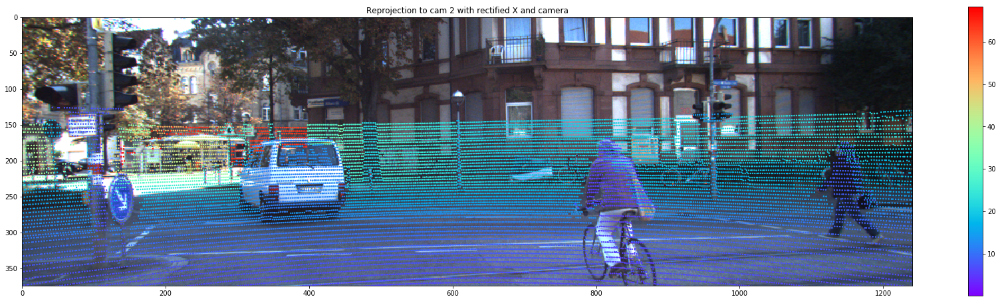

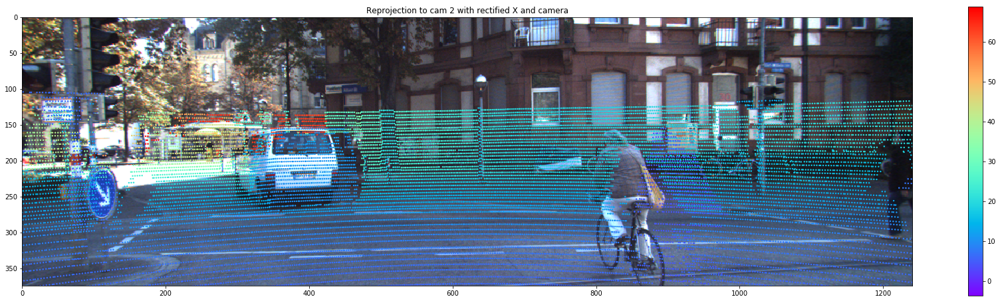

[[ 0.9992  0.0031 -0.0403 -0.0131]
 [-0.0021  0.9997  0.0236 -0.0231]
 [ 0.0404 -0.0235  0.9989  0.9905]]
Between frame 0 and 3: The rotation angle (degree) 2.6813, and translation angle (degree) 1.5369
-- delta_Rtij_gt [[ 0.9992 -0.0021  0.0404 -0.0269]
 [ 0.0031  0.9997 -0.0235  0.0464]
 [-0.0403  0.0236  0.9989 -0.9894]]
-- E_gt [[ 0.0012  0.9902  0.0231]
 [-0.9897  0.0027 -0.013 ]
 [-0.0465 -0.0268 -0.0012]]
# kps: 3420, descriptors: (3420, 128)
# kps: 3421, descriptors: (3421, 128)
# good points:  609
--------------- Sample points, and check epipolar and Sampson distances. ---------------


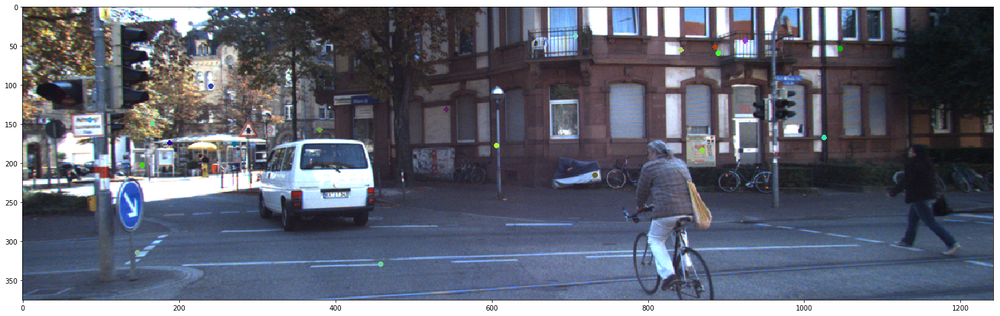

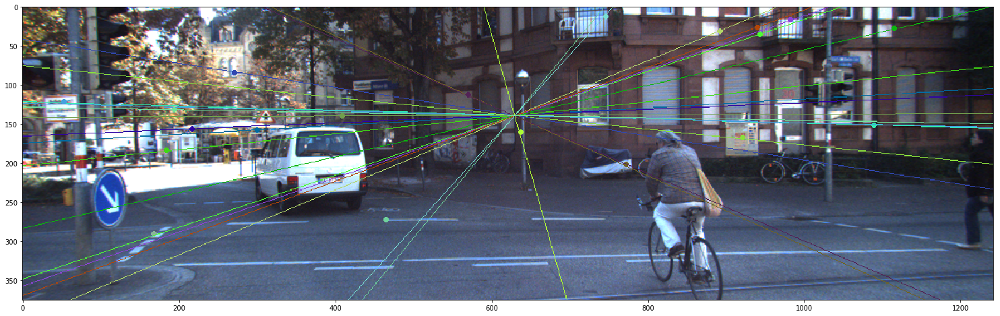

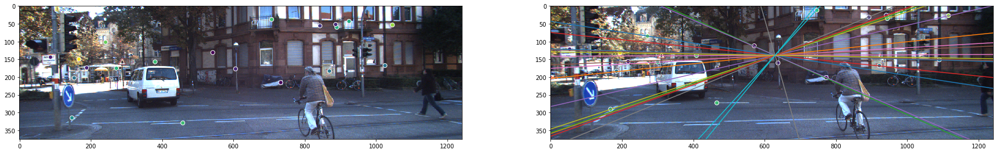

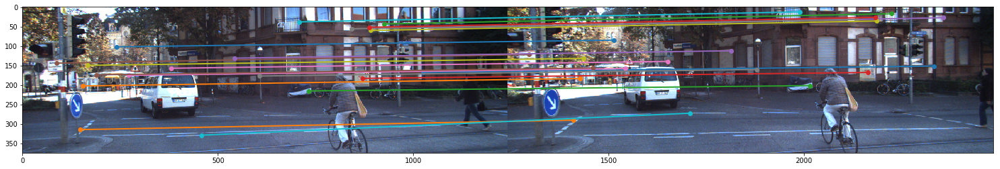

[   0.2036   43.9993    0.9108    0.3169    0.1346    4.9947    0.0182
    0.1677    0.0251 1044.998     0.0196    0.9508    0.0552    0.0028
    1.2081    0.0372    0.0587    1.1378    0.0564    0.5241]


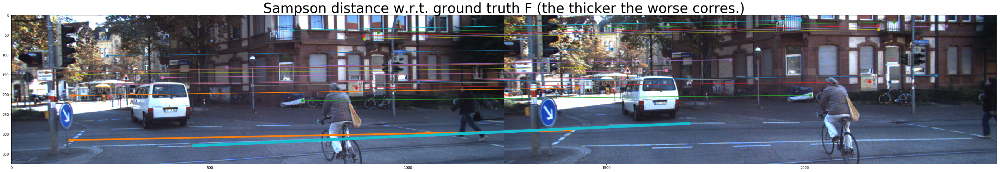

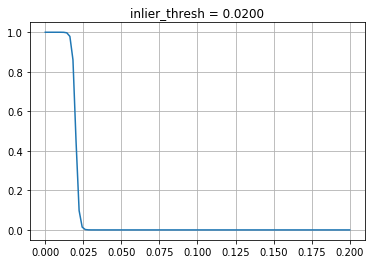

--------------- Check with best 20 corres. ---------------
--- Best 20 errors [0.     0.     0.     0.     0.     0.     0.0001 0.0001 0.0002 0.0003
 0.0003 0.0003 0.0003 0.0003 0.0004 0.0005 0.0006 0.0007 0.0007 0.0007]
+++ E est&GT [[-0.0014 -0.9915 -0.0224]
 [ 0.9878 -0.0051  0.0463]
 [ 0.0454 -0.0083  0.0019]]
[[ 0.0012  0.9902  0.0231]
 [-0.9897  0.0027 -0.013 ]
 [-0.0465 -0.0268 -0.0012]]
=== M [[-0.9985  0.0042 -0.055  -0.0081]
 [-0.0004 -0.9977 -0.0685 -0.0459]
 [-0.0551 -0.0683  0.9961  0.9989]]
--- F est&GT [[-0.     -0.      0.0003]
 [ 0.     -0.     -0.0011]
 [-0.0003  0.0012 -0.0291]]
[[ 0.      0.     -0.0003]
 [-0.      0.      0.0011]
 [ 0.0003 -0.0012  0.0291]]
--- 118/609 inliers.


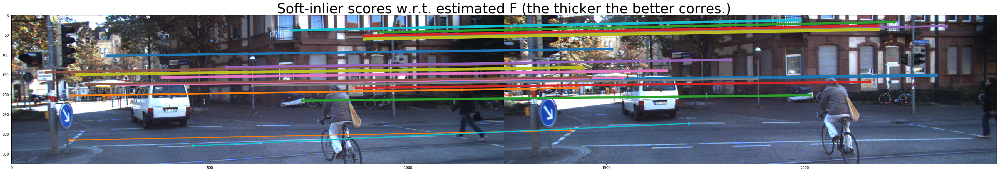

-- F_est & F_gt [[-0.     -0.      0.0003]
 [ 0.     -0.     -0.001 ]
 [-0.0003  0.0011 -0.0291]]
[[ 0.      0.     -0.0003]
 [-0.      0.      0.0011]
 [ 0.0003 -0.0012  0.0291]]
-- E_est & E_gt [[-0.0025 -0.9902  0.002 ]
 [ 0.9887 -0.0025  0.0659]
 [ 0.0209 -0.0262  0.0014]]
[[ 0.0012  0.9902  0.0231]
 [-0.9897  0.0027 -0.013 ]
 [-0.0465 -0.0268 -0.0012]]
# 278/609 inliers from DSAC.
-- Good M: [[ 0.9992 -0.0028  0.0401  0.0264]
 [ 0.0037  0.9997 -0.0232  0.0212]
 [-0.0401  0.0233  0.9989 -0.9994]]
The 3_th Rt meets the Cheirality Condition! with [R|t]:
Recovered by ours: The rotation error (degree) 0.0443, and translation error (degree) 3.3851
[[ 0.9992  0.0037 -0.0401 -0.0665]
 [-0.0028  0.9997  0.0233  0.0022]
 [ 0.0401 -0.0232  0.9989  0.9978]]
# 584/609 inliers from OpenCV.
Recovered by OpenCV: The rotation error (degree) 5.3994, and translation error (degree) 0.6305
[[ 0.9991 -0.0022  0.0413 -0.0028]
 [ 0.0032  0.9997 -0.0231 -0.0197]
 [-0.0413  0.0232  0.9989  0.9998]]
GT came

In [454]:
%reload_ext autoreload
%autoreload 2
i = 0
j = 3

# Get two frames
X_rect_i, X_rect_i_vis, delta_Rtij, delta_Rtij_inv, img1_rgb, img2_rgb = kitti_two_frame_loader.get_ij(i, j, visualize=True)
# X_rect_i, X_rect_i_vis, delta_Rtij, delta_Rtij_inv, img1_rgb, img2_rgb = kitti_two_frame_loader.get_i_lr(i, visualize=True)

print('-- delta_Rtij_gt', delta_Rtij)
E_gt_th, F_gt_th = utils_F._E_F_from_Rt(delta_Rtij[:, :3], delta_Rtij[:, 3:4], kitti_two_frame_loader.K)    
F_gt = F_gt_th.numpy()
E_gt_th_inv, F_gt_th_inv = utils_F._E_F_from_Rt(delta_Rtij_inv[:, :3], delta_Rtij_inv[:, 3:4], kitti_two_frame_loader.K)    
F_gt_inv = F_gt_th_inv.numpy()
R2s, t2s, M2s = utils_F._get_M2s(E_gt_th)
print('-- E_gt', E_gt_th.numpy())

img1_rgb_np, img2_rgb_np = np.array(img1_rgb), np.array(img2_rgb)
img1, img2 = utils_opencv.PIL_to_gray(img1_rgb), utils_opencv.PIL_to_gray(img2_rgb)

# Keypoint detection and matching with SIFT
x1_all, kp1, des1 = utils_opencv.SIFT_det(img1, img1_rgb, visualize=False)
x2_all, kp2, des2 = utils_opencv.SIFT_det(img2, img2_rgb, visualize=False)
x1, x2 = utils_opencv.KNN_match(des1, des2, x1_all, x2_all, kp1, kp2, img1_rgb, img2_rgb, visualize=False)

# Sample and check
random_idx, x1_sample, x2_sample = utils_opencv.sample_and_check(x1, x2, img1_rgb, img2_rgb, img1_rgb_np, img2_rgb_np, F_gt, kitti_two_frame_loader, visualize=True)

# DSAC
DSAC_params = {}
DSAC_params['inlier_beta'] = 1000
DSAC_params['inlier_thresh'] = 0.02 # HOW TO SET THRES?
DSAC_params['N_hypotheses'] = 1000
DSAC_params['inlier_alpha'] = 0.5

## Visualize soft-inlier counting function
a = torch.linspace(0, DSAC_params['inlier_thresh']*10, 100)
b = 1 - torch.sigmoid(DSAC_params['inlier_beta'] * (a - DSAC_params['inlier_thresh']))
plt.plot(a.numpy(), b.numpy())
plt.grid()
plt.title('inlier_thresh = %.4f'%DSAC_params['inlier_thresh'])
plt.show()

## Validate pose estimation with best 10
mask_index_8 = utils_F.vali_with_best10(F_gt_th, E_gt_th, x1, x2, img1_rgb_np, img2_rgb_np, kitti_two_frame_loader, DSAC_params)

## Set up DSAC
loss = HLoss()
dsac = DSAC(DSAC_params['N_hypotheses'], DSAC_params['inlier_thresh'], DSAC_params['inlier_beta'], DSAC_params['inlier_alpha'], loss)
N_scores = dsac(torch.from_numpy(x1), torch.from_numpy(x2), F_gt_th)
N_scores_np = N_scores.numpy()
N_scores_np = N_scores_np/np.max(N_scores_np)

utils_vis.draw_corr_widths(img1_rgb_np, img2_rgb_np, x1_sample, x2_sample, N_scores_np[random_idx]*10+1, 'Soft-inlier scores w.r.t. estimated F (the thicker the better corres.)', False)

F_est_th = dsac.best_H
# F_est_th_8 = utils_F._F_from_XY(torch.from_numpy(x1[mask_index_10, :]), torch.from_numpy(x2[mask_index_10, :]))
# F_est_th = F_est_th_8

best_corres_idx = dsac.best_corres_idx
print('-- F_est & F_gt', (F_est_th / torch.norm(F_est_th) * torch.norm(F_gt_th)).numpy())
print(F_gt)

E_est_th = utils_F._F_to_E(F_est_th, kitti_two_frame_loader.K_th)
print('-- E_est & E_gt', (E_est_th / torch.norm(E_est_th) * torch.norm(E_gt_th)).numpy())
print(E_gt_th.numpy())

## Recover [R|t]
inlier_dists = dsac.sampson_dists.numpy()[dsac.best_H_idx, :]
inlier_mask = inlier_dists < DSAC_params['inlier_thresh']
print('# %d/%d inliers from DSAC.'%(np.sum(inlier_mask), inlier_mask.shape[0]))
M2_list = utils_F._E_to_M(E_est_th, kitti_two_frame_loader.K, x1, x2, inlier_mask, delta_Rtij_inv)

## OpenCV results
utils_opencv.recover_camera(kitti_two_frame_loader.K, x1, x2, delta_Rtij_inv, threshold=0.01)

print('GT camera matrix:')
print(delta_Rtij_inv)

In [451]:
M12 = utils_opencv.recover_camera(kitti_two_frame_loader.K, x1, x2, delta_Rtij_inv, threshold=0.01)
# M21 = utils_opencv.recover_camera(kitti_two_frame_loader.K, x2, x1, delta_Rtij_inv, threshold=0.1)
# print(utils_misc.Rt_depad(np.linalg.inv(utils_misc.Rt_pad(M21))))

# 229/229 inliers from OpenCV.
Recovered by OpenCV: The rotation error (degree) 14.7200, and translation error (degree) 5.6693
[[ 0.9919 -0.0078  0.1271  0.0257]
 [ 0.0088  0.9999 -0.0073  0.007 ]
 [-0.127   0.0083  0.9919  0.9996]]


In [385]:
print(delta_Rtij)
print(delta_Rtij_inv)

[[ 0.9999 -0.0009  0.0104  0.4071]
 [ 0.0009  1.     -0.0002 -0.0214]
 [-0.0104  0.0002  0.9999 -0.5657]]
[[ 0.9999  0.0009 -0.0104 -0.413 ]
 [-0.0009  1.      0.0002  0.0219]
 [ 0.0104 -0.0002  0.9999  0.5614]]


In [292]:
F_est_th_8 = utils_F._F_from_XY(torch.from_numpy(x1[mask_index_8, :]), torch.from_numpy(x2[mask_index_10, :]))
F_est_th = F_est_th_8

In [169]:
# Compare with OpenCV with refs from:
## https://github.com/vcg-uvic/learned-correspondence-release/blob/16bef8a0293c042c0bd42f067d7597b8e84ef51a/tests.py#L232
## https://stackoverflow.com/questions/33906111/how-do-i-estimate-positions-of-two-cameras-in-opencv
## http://answers.opencv.org/question/90070/findessentialmat-or-decomposeessentialmat-do-not-work-correctly/
print(kitti_two_frame_loader.K)
E, mask = cv2.findEssentialMat(x1, x2, focal=721.5377, pp=(609.5593, 172.854), method=cv2.RANSAC, threshold=0.1)
points, R, t, mask = cv2.recoverPose(E, x1, x2)
print(R, t)

delta_Rtij_inv = utils_misc.Rt_depad(np.linalg.inv(utils_misc.Rt_pad(delta_Rtij)))
error_R = utils_geo.rot12_to_angle_error(R, delta_Rtij_inv[:, :3])
error_t = utils_geo.vector_angle(t, delta_Rtij_inv[:, 3:4])
print('The rotation error (degree) %.4f, and translation error (degree) %.4f'%(error_R, error_t))

[[721.5377   0.     609.5593]
 [  0.     721.5377 172.854 ]
 [  0.       0.       1.    ]]
[[ 1.     -0.0004  0.0029]
 [ 0.0004  1.      0.0003]
 [-0.0029 -0.0003  1.    ]] [[ 0.9999]
 [-0.0059]
 [ 0.0155]]
The rotation error (degree) 0.1669, and translation error (degree) 0.8861


In [167]:
print(delta_Rtij)
print(delta_Rtij_inv)

[[ 1.      0.      0.     -0.5327]
 [ 0.      1.      0.      0.0028]
 [ 0.      0.      1.     -0.    ]]
[[ 1.      0.      0.      0.5327]
 [ 0.      1.      0.     -0.0028]
 [ 0.      0.      1.      0.    ]
 [ 0.      0.      0.      1.    ]]


In [132]:
print(kitti_two_frame_loader.K)
print(kitti_two_frame_loader.K @ np.array([[0.], [0.], [1.]]))

[[721.5377   0.     609.5593]
 [  0.     721.5377 172.854 ]
 [  0.       0.       1.    ]]
[[609.5593]
 [172.854 ]
 [  1.    ]]


# With SuperPoint corres.

In [79]:
sp_results = np.load('dsac_tools/data/0000000000.npz')
print(x.files)
x1_sp = sp_results['keypoints1']
x2_sp = sp_results['keypoints2']
maches_sp = sp_results['matches']
x1 = maches_sp[:, :2]
x2 = maches_sp[:, 2:4]
print(x1_sp.shape, x2_sp.shape, maches_sp.shape)
print(x1.shape, x2.shape)

draw_corr_widths(img1_rgb, img2_rgb, x1, x2, np.zeros(x1.shape[0])+3, 'SuperPoint detection and correspondence', rescale=False)

errors = utils_F._sampson_dist(F_gt_th, torch.from_numpy(x1).to(torch.float64), torch.from_numpy(x2).to(torch.float64), False)
sort_index = np.argsort(errors.numpy())
mask_index = sort_index[:10]
print(errors[sort_index].numpy())

E_est_th = utils_F.E_from_XY(torch.from_numpy(x1[mask_index, :]), torch.from_numpy(x2[mask_index, :]))
print(E_gt_th.numpy())
print((E_est_th / torch.norm(E_est_th) * torch.norm(E_gt_th)).numpy())
R2s, t2s, M2s = utils_F._get_M2s(E_est_th)
print(M2s[0].numpy())

error_R = min([utils_F.rot12_to_angle_error(R2.numpy(), delta_R_gt) for R2 in R2s])
print('The rotation error of best 10 corres. w.r.t GT F (degree): ', error_R)

NameError: name 'x' is not defined

In [ ]:
%reload_ext autoreload
%autoreload 2

from dsac_tools.H_loss import HLoss
from dsac_tools.dsac import DSAC
import dsac_tools.utils_F as utils_F
import torch

N_hypotheses = 10000
inlierthreshold = 0.05
inlierbeta = 100.
inlieralpha = 0.5

loss = HLoss()
dsac = DSAC(N_hypotheses, inlierthreshold, inlierbeta, inlieralpha, loss)
N_scores = dsac(torch.from_numpy(x1), torch.from_numpy(x2), F_gt_th)
N_scores_np = N_scores.numpy()
N_scores_np = N_scores_np/np.max(N_scores_np)

draw_corr_widths(img1_rgb, img2_rgb, x1, x2, N_scores_np*5, 'Soft-inlier scores w.r.t. estimated F (the thicker the better corres.)', False)

F_est_th = dsac.best_H
best_corres_idx = dsac.best_corres_idx
# print((F_est_th / torch.norm(F_est_th) * torch.norm(F_gt_th)).numpy())
# print(F_gt)

E_est_th = utils_F._F_to_E(F_est_th, K_th)
print((E_est_th / torch.norm(E_est_th) * torch.norm(E_gt_th)).numpy())
print(E_gt_th.numpy())

R2s, t2s, M2s = utils_F._get_M2s(E_est_th)
# print([M2.numpy() for M2 in M2s])

R1 = np.eye(3)
t1 = np.zeros((3, 1))
M1 = np.hstack((R1, t1))

cheirality_checks = []
for Rt_idx, M2 in enumerate(M2s):
    M2 = M2.numpy()
    R2 = M2[:, :3]
    t2 = M2[:, 3:4]
    
    X_tri_homo = cv2.triangulatePoints(np.matmul(K, M1), np.matmul(K, M2), x1[best_corres_idx, :].T, x2[best_corres_idx, :].T)
    X_tri = X_tri_homo[:3, :]/X_tri_homo[-1, :]
    cheirality1 = np.matmul(R1[2:3, :], (X_tri-t1))
    
    X_tri_cam3 = np.matmul(R2, X_tri) + t2
    cheirality2 = np.matmul(R2[2:3, :], (X_tri-t2))
    cheirality_checks.append(np.min(cheirality1)>0 and np.min(cheirality2)>0)
    
    print('===========')
    print(M2)
    print('-----')
    print(cheirality1)
    print('-----')
    print(cheirality2)

if np.sum(cheirality_checks)==1:
    Rt_idx = cheirality_checks.index(True)
    print('The %d_th Rt meets the Cheirality Condition! with [R|t]:'%Rt_idx)
    print(M2s[Rt_idx].numpy())
else:
    print('Error! %d of qualified [R|t] found!'%np.sum(cheirality_checks))

error_R = min([utils_F.rot12_to_angle_error(R2.numpy(), delta_R_gt) for R2 in R2s])
print('The rotation error from RANSAC (degree): ', error_R)